In [36]:
import pandas as pd
import numpy as np

excell_file = '/Users/carlosrincon/Library/CloudStorage/OneDrive-UniversitatRamónLlull/Data/customer_sales_20210101to20230621_v1 (2).xlsx'

df = pd.read_csv('5daysmarch.csv')
df_sales = pd.read_excel(excell_file)

# Viewing the data

Viewing both datasets provided by Amplifon:

Initially what we can see in this data is that dataset **"df"** contains current funnel data from a more service point of view, this data will allow us to get insights on the specific touch points amplifon has with their customers, such as, the most common last interaction before a sale occured, the median and avergae times between each touch points etc.

On the other hand dataset **"df_sales"** contains sales information, the date, the number of units sold, the value of the sale and where alng the customer journey the person was along before converting to paying customer

In [2]:
# function to display missing values in a percentage format with column names
def null_checker(df):
    null_check = df.isnull().sum()/len(df)

    for col_name, pct_null in null_check.items():
        print(f"{col_name} is {round(pct_null*100,2)}% null")

In [3]:
null_checker(df)

Customer Code is 0.28% null
Agenda Appointments is 0.0% null
Appointments Completed is 29.22% null
Customer Code.1 is 0.28% null
Customer Type Group is 0.0% null
Shop Code - Descr is 0.0% null
Service Category Descr is 0.0% null
Service Descr is 0.0% null


In [4]:
null_checker(df_sales)

Unnamed: 0 is 16.67% null
Unnamed: 1 is 16.67% null


Nearly 30% of columm `Appointments Completed` is <i>null</i> if these customers are mainly in the customer group type **PROSPECT** we can assume its because they have yet to have their appointment, the rest may be cases that never showed up, but we will check deeper into this if needed, for now we will just impute the missing values with `0`

In [5]:
# df_mod1 to indicate the first modification done on the dataset
df_mod1 = df
df_mod1['Appointments Completed'] = df_mod1['Appointments Completed'].fillna(0)
df_mod1 = df_mod1[df_mod1['Customer Code'].notna()]

## In depth look at categorical values

We will check how the customers are distributed across the different categorical values by grouping by and counting ocurrences

In [6]:
# Assuming you have a DataFrame named 'df' with columns 'Service Category Descr', 'Service Descr', and 'Customer Type Group'

# Group by 'Service Category Descr' and 'Service Descr', and count occurrences
grouped_df = df.groupby(['Service Category Descr', 'Service Descr'])['Service Descr'].agg(['count'])

# Reset the index to get the result as columns
grouped_df.reset_index(inplace=True)

# Rename the count column
grouped_df.rename(columns={'count': 'Customers'}, inplace=True)

# Calculate the total occurrences for each 'Service Category Descr'
total_occurrences = grouped_df['Customers'].sum()

# Calculate the percentage of occurrence relative to the total for each row
grouped_df['PCT Total'] = round((grouped_df['Customers'] / total_occurrences) * 100,2)

# Find the most common value in 'Customer Type Group' for each group
most_common_customer_type = df.groupby(['Service Category Descr', 'Service Descr'])['Customer Type Group'].agg(lambda x: x.value_counts().idxmax())

# Merge the most common customer type information into the original DataFrame
grouped_df['Most Common Customer Type'] = grouped_df.apply(lambda row: most_common_customer_type.get((row['Service Category Descr'], row['Service Descr'])), axis=1)

# Display the resulting DataFrame
grouped_df


,Service Category Descr,Service Descr,Customers,PCT Total,Most Common Customer Type
0,1st APPS,EXAMEN TELEMARKETING LE,1538,5.88,LEAD
1,1st APPS,OPORTUNIDAD 15 MINUTOS,168,0.64,CUSTOMER
2,1st APPS,OPORTUNIDAD 45 MINUTOS,154,0.59,CUSTOMER
3,1st APPS,OPORTUNIDAD POTENCIAL,3398,12.99,PROSPECT
4,1st APPS,VISITA COMPLETA /OPORTUNIDAD,12165,46.51,CUSTOMER
5,1st APPS,VISITA COMPLETA/OPORTUNIDAD infantil,4,0.02,LEAD
6,Pre-Sales,1° CONTROL PRUEBA,1904,7.28,LEAD
7,Pre-Sales,2° CONTROL PRUEBA,1133,4.33,LEAD
8,Pre-Sales,3° CONTROL PRUEBA,765,2.92,LEAD
9,Pre-Sales,CIERRE DE LA PRUEBA,1770,6.77,LEAD


In [7]:
'''More granular view of the data'''

# Group by 'Service Category Descr' and 'Service Descr', and count occurrences
grouped_df = df.groupby(['Service Category Descr', 'Service Descr', 'Customer Type Group'])['Service Descr'].agg(['count'])

# Reset the index to get the result as columns
grouped_df.reset_index(inplace=True)

# Rename the count column
grouped_df.rename(columns={'count': 'Occurrences'}, inplace=True)

# Calculate the total occurrences for each 'Service Category Descr'
total_occurrences = grouped_df['Occurrences'].sum()

# Calculate the percentage of occurrence relative to the total for each row
grouped_df['Percentage'] = (grouped_df['Occurrences'] / total_occurrences) * 100

grouped_df


,Service Category Descr,Service Descr,Customer Type Group,Occurrences,Percentage
0,1st APPS,EXAMEN TELEMARKETING LE,CUSTOMER,105,0.401422
1,1st APPS,EXAMEN TELEMARKETING LE,LEAD,1235,4.721489
2,1st APPS,EXAMEN TELEMARKETING LE,PROSPECT,198,0.756968
3,1st APPS,OPORTUNIDAD 15 MINUTOS,CUSTOMER,76,0.290553
4,1st APPS,OPORTUNIDAD 15 MINUTOS,LEAD,66,0.252323
5,1st APPS,OPORTUNIDAD 15 MINUTOS,PROSPECT,26,0.099400
6,1st APPS,OPORTUNIDAD 45 MINUTOS,CUSTOMER,65,0.248499
7,1st APPS,OPORTUNIDAD 45 MINUTOS,LEAD,53,0.202623
8,1st APPS,OPORTUNIDAD 45 MINUTOS,PROSPECT,36,0.137630
9,1st APPS,OPORTUNIDAD POTENCIAL,CUSTOMER,508,1.942119


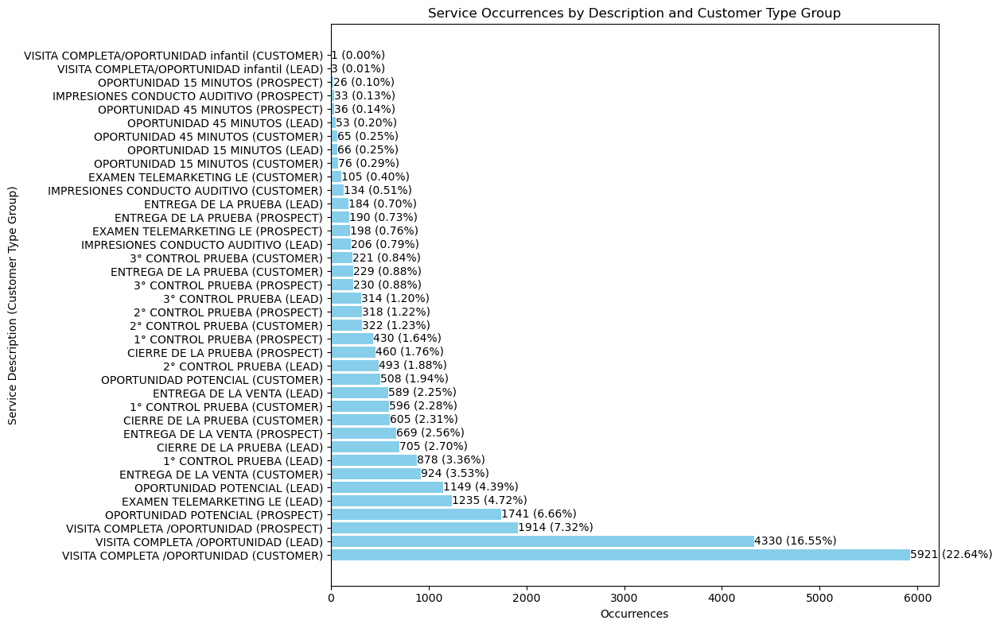

In [8]:
import matplotlib.pyplot as plt

# Assuming grouped_df is defined

# Sort the DataFrame by 'Occurrences' in descending order
grouped_df = grouped_df.sort_values(by='Occurrences', ascending=False)

# Plotting
plt.figure(figsize=(12, 8))  # Adjust the figure size as needed
plt.barh(grouped_df['Service Descr'] + ' (' + grouped_df['Customer Type Group'] + ')',
         grouped_df['Occurrences'],
         color='skyblue')
plt.xlabel('Occurrences')
plt.ylabel('Service Description (Customer Type Group)')
plt.title('Service Occurrences by Description and Customer Type Group')
plt.tight_layout()

# In case you want to show percentages on the bars
for i, value in enumerate(grouped_df['Occurrences']):
    plt.text(value, i, f'{value} ({grouped_df["Percentage"].iloc[i]:.2f}%)', va='center')

plt.show()


<Figure size 2000x1200 with 0 Axes>

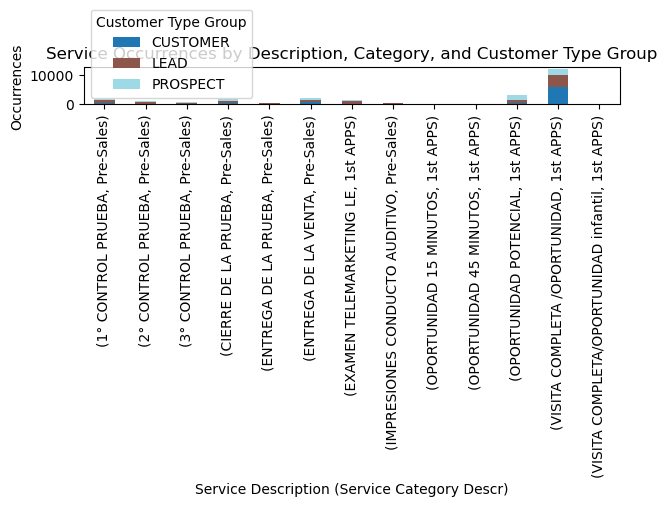

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming grouped_df is defined

# Pivot the DataFrame to get the required structure
pivoted_df = grouped_df.pivot_table(index=['Service Descr', 'Service Category Descr'],
                                    columns='Customer Type Group',
                                    values='Occurrences',
                                    fill_value=0)

# Plotting
plt.figure(figsize=(20, 12))  # Adjust the figure size for more space

# Bar plot
pivoted_df.plot(kind='bar', stacked=True, colormap='tab20')

plt.xlabel('Service Description (Service Category Descr)')
plt.ylabel('Occurrences')
plt.title('Service Occurrences by Description, Category, and Customer Type Group')
plt.tight_layout()

# Save the plot to a file (e.g., PNG)
plt.savefig('grouped_bar_plot.png', dpi=300)  # You can adjust the DPI as needed


<Figure size 1600x1000 with 0 Axes>

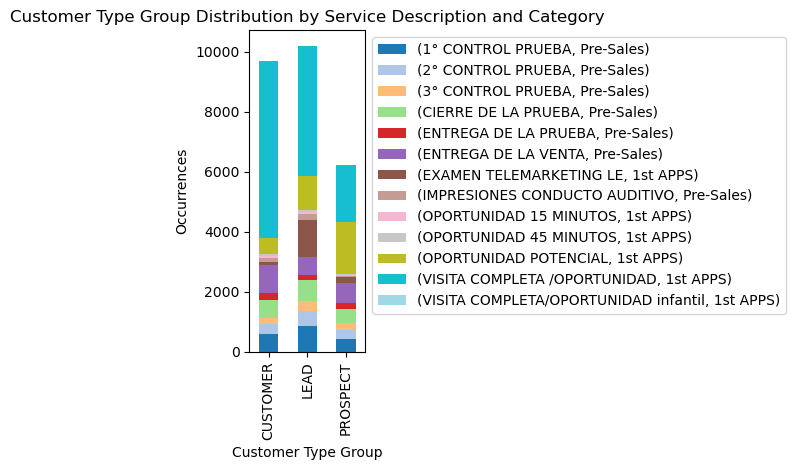

In [10]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming grouped_df is defined

# Pivot the DataFrame to get the required structure
pivoted_df = grouped_df.pivot_table(index=['Customer Type Group'],
                                    columns=['Service Descr', 'Service Category Descr'],
                                    values='Occurrences',
                                    fill_value=0)

# Plotting
plt.figure(figsize=(16, 10))  # Adjust the figure size as needed

# Bar plot
ax = pivoted_df.plot(kind='bar', stacked=True, colormap='tab20')

plt.xlabel('Customer Type Group')
plt.ylabel('Occurrences')
plt.title('Customer Type Group Distribution by Service Description and Category')

# Move the legend outside the plot to avoid overlapping
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

plt.tight_layout()

plt.show()


In [37]:
# Removing negative values from the sales data frame
df_sales_mod1 = df_sales[(df_sales['HA Sales (Units)'] > 0) | (df_sales['HA Sales (Value)'] > 0)]
df_sales_mod2 = df_sales_mod1[(df_sales_mod1['HA Sales (Units)'] >= 0) & (df_sales_mod1['HA Sales (Value)'] >= 0)]

In [ ]:
df_sales_mod2.describe()

,HA Sales (Units),HA Sales (Value)
count,231492.000000,231492.000000
mean,1.669539,3028.234388
std,0.494921,1121.014974
min,0.000000,0.000000
25%,1.000000,2069.999700
50%,2.000000,3363.636475
75%,2.000000,3900.000000
max,6.000000,11413.636230


# Modeling data
Because the appointments data is limited to the first 5 days of march, which is not enough to work with, we will model the sales data. Another export of appointments data is pending.

## LightGBM - First Interation


In [25]:
# No not use if using the merged data set
df_sales_preprocess = pd.read_excel(excell_file)

In [27]:
'''Just sales Dataset'''
# No not use if using the merged data set
df_sales_preprocess = pd.read_excel(excell_file, parse_dates=['Date'])

# remove negative sales (returns)
df_sales_preprocess = df_sales_preprocess[(df_sales_preprocess['HA Sales (Units)'] >= 0) & (df_sales_preprocess['HA Sales (Value)'] >= 0)]

#drop null values
df_sales_preprocess = df_sales_preprocess.dropna()

# remove unique identifier columns
df_sales_preprocess = df_sales_preprocess.drop('Customer Code', axis=1)

# remove Sales value column since technically we are also trying to predict this
df_sales_preprocess = df_sales_preprocess.drop('HA Sales (Units)', axis=1)

df_sales_preprocess = df_sales_preprocess.sort_values(by='Date')

df_sales_preprocess = df_sales_preprocess.groupby(['Date'])['HA Sales (Value)'].sum()

In [28]:
n1 = round(len(df_sales_preprocess)*0.35,0)
n2 = round(len(df_sales_preprocess)*0.9,0)

df_sales_preprocess=df_sales_preprocess.iloc[int(n1):]

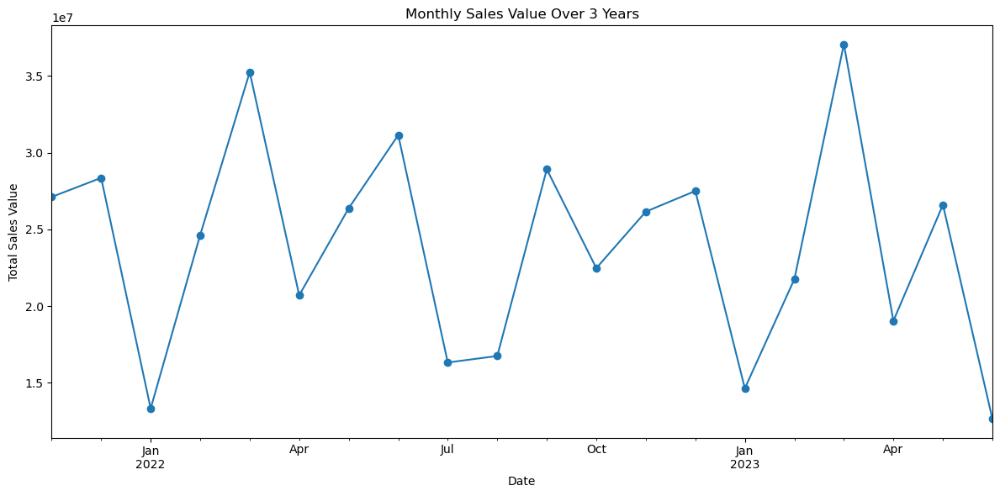

In [29]:
import matplotlib.pyplot as plt

# Assuming df_sales is your DataFrame with 'Date' as the index and other columns
# Replace this with your actual DataFrame
# df_sales = ...

# Resample data into monthly bins and sum the sales values
df_monthly_sales = df_sales_preprocess.resample('M').sum()

# Create a larger figure for better visualization
plt.figure(figsize=(12, 6))

# Plotting the data
df_monthly_sales.plot(kind='line', marker='o')

# Adding labels and title
plt.xlabel('Date')
plt.ylabel('Total Sales Value')
plt.title('Monthly Sales Value Over 3 Years')

# Show the plot
plt.tight_layout()
plt.show()

In [30]:
import numpy as np
import pandas as pd
from sklearn.model_selection import TimeSeriesSplit
import lightgbm as lgb
from sklearn.model_selection import train_test_split, GridSearchCV



df = pd.DataFrame(df_sales_preprocess, columns=['HA Sales (Value)'], index=df_sales_preprocess.index)

# Create lag features
for lag in range(1, 9):
    df[f'Lag_{lag}'] = df['HA Sales (Value)'].shift(lag)

# Drop missing values
df.dropna(inplace=True)

# Split data into training and testing sets
X = df.drop('HA Sales (Value)', axis=1)
y = df['HA Sales (Value)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Define the hyperparameter grid for GridSearchCV
param_grid = {
    'num_leaves': [15, 25, 75],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [5, 20, 100],
    'min_child_samples': [15, 25, 75],
    'reg_alpha': [0.0, 0.1, 0.5]
}

# Create the LightGBM model with custom objective
lgb_model = lgb.LGBMRegressor(metric='rmse', num_leaves=50, learning_rate=0.01)

# Use TimeSeriesSplit for cross-validation
tscv = TimeSeriesSplit(n_splits=3)

# Perform GridSearchCV with TimeSeriesSplit
grid_search = GridSearchCV(estimator=lgb_model, param_grid=param_grid,
                           scoring='neg_mean_squared_error', cv=tscv)

grid_search.fit(X_train, y_train)

# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print(f"Best Parameters: {best_params}")
print(f"Best RMSE Score: {-best_score}")

# Fit the model on the training data with the best parameters
best_lgb_model = grid_search.best_estimator_
best_lgb_model.fit(X_train, y_train)

# Predict using the model on the test data
y_pred = best_lgb_model.predict(X_test)

# Calculate SMAPE
smape = np.mean(2 * np.abs(y_pred - y_test) / (np.abs(y_pred) + np.abs(y_test))) * 100
print(f"SMAPE on Test Data: {smape:.2f}%")


# Create a DataFrame for test results
df_results = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred}, index=X_test.index)

# Display the results DataFrame
print(df_results)


Best Parameters: {'learning_rate': 0.05, 'max_depth': 5, 'min_child_samples': 15, 'num_leaves': 15, 'reg_alpha': 0.0}
Best RMSE Score: 537957915448.18634
SMAPE on Test Data: 65.52%
                  Actual     Predicted
Date                                  
2023-03-01  2.645497e+05  3.297884e+06
2023-03-02  4.466280e+05  2.343959e+05
2023-03-03  5.513770e+05  3.287417e+05
2023-03-04  7.202727e+03 -1.038226e+05
2023-03-05  0.000000e+00  4.096128e+05
...                  ...           ...
2023-06-16  1.105632e+06  1.169036e+06
2023-06-17  9.200000e+03  3.313700e+05
2023-06-19  1.221355e+06  1.231043e+06
2023-06-20  1.368703e+06  1.431381e+06
2023-06-21  1.471044e+06  1.537773e+06

[98 rows x 2 columns]


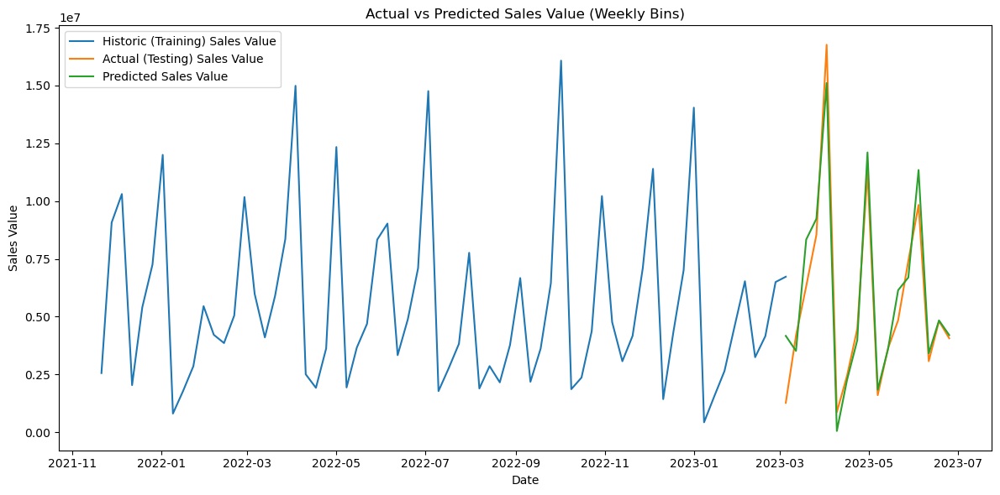

In [49]:
import pandas as pd
import matplotlib.pyplot as plt

# Predict on the test data
y_pred = best_lgb_model.predict(X_test)

# Convert index to datetime if not already in datetime format
y_train.index = pd.to_datetime(y_train.index)
y_test.index = pd.to_datetime(y_test.index)

# Resample the data to weekly intervals
y_train_weekly = y_train.resample('W').sum()
y_test_weekly = y_test.resample('W').sum()
y_pred_weekly = pd.Series(y_pred.squeeze(), index=y_test.index).resample('W').sum()

# Plot actual and predicted values
plt.figure(figsize=(12, 6))
plt.plot(y_train_weekly.index, y_train_weekly, label='Historic (Training) Sales Value')
plt.plot(y_test_weekly.index, y_test_weekly, label='Actual (Testing) Sales Value')
plt.plot(y_test_weekly.index, y_pred_weekly, label='Predicted Sales Value')
plt.xlabel('Date')
plt.ylabel('Sales Value')
plt.title('Actual vs Predicted Sales Value (Weekly Bins)')
plt.legend()
plt.tight_layout()
plt.show()


# Second Interation

Some of the issues with the previous model will be making predictions, al though we got an interesting result, we need to aggregate sales by day. Since we have no way of predicting how many sales will take place each given day (that would be the job for a sepperate model).

This current model involves making predictions for each custoemr category as well as the day's total. An improvement for the model would include a complete set of the appointments data that would proportionate the model with aditional predictors.

In [38]:
df_sales.head(5)

,Date,Customer Code,Customer Type Group,HA Sales (Units),HA Sales (Value)
0,2023-06-21,00000PLE,LEAD,2.0,4090.916504
1,2023-06-21,00001LPZ,CUSTOMER,2.0,3818.180000
2,2023-06-21,00001Y3Q,PROSPECT,2.0,4036.380000
3,2023-06-21,000023OO,LEAD,1.0,2186.363770
4,2023-06-21,00002EOG,CUSTOMER,2.0,3818.180000


In [39]:
# Aggregate and turn the categories as columns so that the day's salaes are split by category.
df_sales = df_sales.sort_values('Date')
df_date_index = df_sales.set_index('Date')
df_sales_grouped = df_date_index.groupby([df_date_index.index, 'Customer Type Group'])['HA Sales (Value)'].sum().unstack()
df_sales_grouped = df_sales_grouped.fillna(0)
df_sales_grouped['TOTAL SALES'] = df_sales_grouped['CUSTOMER'] + df_sales_grouped['LEAD'] + df_sales_grouped['PROSPECT']

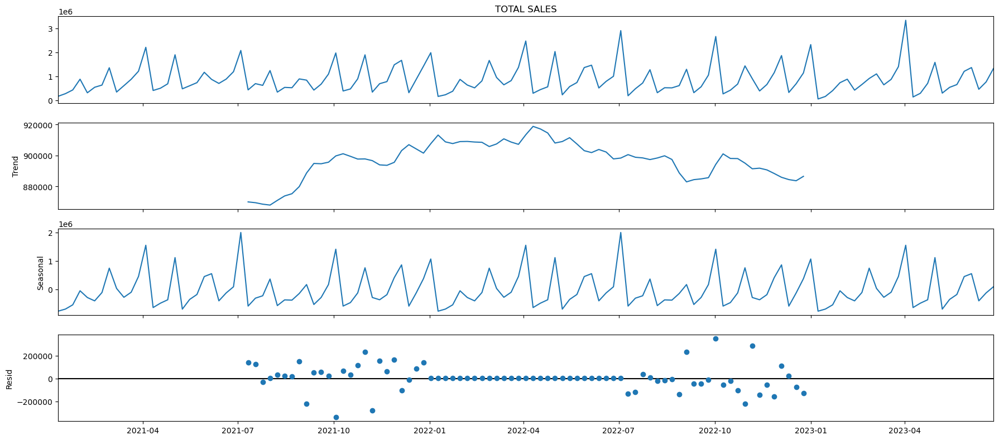

In [40]:
from pylab import rcParams
import statsmodels.api as sm

weekly_sum = df_sales_grouped['TOTAL SALES'].resample('W').mean()

rcParams['figure.figsize'] = 18, 8
decomposition = sm.tsa.seasonal_decompose(weekly_sum, model='additive')
fig = decomposition.plot()
plt.show()

#### Observed Plot:

The observed plot shows the original time series data. It represents the actual values you have in your dataset over time.
Interpretation: Look for overall patterns, trends, and irregularities in the original data. This plot is essential for understanding the raw behavior of your time series.
#### Trend Plot:

The trend plot displays the estimated trend component of the time series. The trend represents the long-term behavior or the underlying direction in the data.
Interpretation: Examine the trend to identify whether the data is increasing, decreasing, or remaining relatively constant over time. Understanding the trend helps you recognize the underlying, non-seasonal changes in the data.
#### Seasonal Plot:

The seasonal plot shows the estimated seasonal component of the time series. The seasonal component represents regular, repetitive patterns that occur within a fixed period (e.g., daily, weekly, monthly).
Interpretation: Analyze the seasonal component to identify recurring patterns or cycles within the data. Seasonal patterns often repeat at specific intervals, and understanding them is crucial for forecasting and decision-making.
#### Residual Plot:

The residual plot displays the differences between the observed data and the sum of the estimated trend and seasonal components. It represents the unexplained or leftover variability in the data after removing the trend and seasonal patterns.
Interpretation: Examine the residual plot to identify any remaining irregularities or noise in the data. Large residuals can indicate unusual events or outliers that are not explained by the trend and seasonality.

In [66]:
import numpy as np
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, TimeSeriesSplit, GridSearchCV
import lightgbm as lgb

def train_and_test_lightgbm(df, target_column, warm_start=False, param_grid=None):
    
    # Split data into training (80%) and testing (20%) sets
    X_train, X_test, y_train, y_test = train_test_split(df, df[target_column], test_size=0.2, shuffle=False)
    
    # Define preprocessing steps using ColumnTransformer
    preprocessor = ColumnTransformer(
        transformers=[
            ('imputer', SimpleImputer(strategy='mean'), X_train.columns),
            ('scaler', StandardScaler(), X_train.columns)
        ],
        remainder='passthrough'
    )
    
    # Create the LightGBM model
    lgb_model = lgb.LGBMRegressor(objective='regression', metric='rmse', num_leaves=31, learning_rate=0.05, feature_fraction=0.9)
    
    # Check if warm start is enabled
    if warm_start:
        lgb_model.set_params(warm_start=True)
    
    # Create the pipeline
    pipeline = Pipeline([
        ('preprocessor', preprocessor),
        ('model', lgb_model)
    ])
    
    # Use TimeSeriesSplit for cross-validation
    tscv = TimeSeriesSplit(n_splits=3)
    
    # Perform GridSearchCV with TimeSeriesSplit
    grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid,
                               scoring='neg_mean_squared_error', cv=tscv)
    
    # Fit the pipeline on the training data
    grid_search.fit(X_train, y_train)
    
    # Get the best pipeline
    best_pipeline = grid_search.best_estimator_
    
    # Predict using the best pipeline on the test data
    y_pred = best_pipeline.predict(X_test)
    
    # Evaluate the model
    mae = np.mean(np.abs(y_pred - y_test))
    
    return best_pipeline, y_pred, mae

# List of columns in df_grouped_sales
grouped_columns = df_sales_grouped.columns.tolist()

# Dictionary to store pipelines, predictions, and MAEs
results = {}

# Create an empty DataFrame to store predictions
df_predictions = pd.DataFrame(index=df_sales_grouped.index)

def calculate_smape(y_true, y_pred):
    """
    Calculate Symmetric Mean Absolute Percentage Error (SMAPE).
    """
    numerator = np.abs(y_true - y_pred)
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2
    smape = np.mean(numerator / denominator) * 100
    return smape

# Iterate over grouped_columns
for column in grouped_columns:
    print(f"Training and testing model for column: {column}")
    
    # Define the hyperparameter grid for GridSearchCV
    param_grid = {
        'model__num_leaves': [15, 25, 50],
        'model__learning_rate': [0.01, 0.05, 0.1],
        'model__max_depth': [5, 10, 20],
        'model__min_child_samples': [10, 20, 50],
        'model__reg_alpha': [0.0, 0.1, 0.5],
        'model__n_estimators': [50, 100, 200],
        'model__subsample': [0.8, 0.9, 1.0],
        'model__colsample_bytree': [0.8, 0.9, 1.0]
    }
    
    pipeline, predictions, mean_absolute_error = train_and_test_lightgbm(df_sales_grouped, column, param_grid=param_grid)
    results[column] = {"pipeline": pipeline, "mae": mean_absolute_error}
    
    # Store predictions in df_predictions
    df_predictions[column] = np.nan  # Initialize the column
    df_predictions.loc[df_sales_grouped.index[-len(predictions):], column] = predictions


# Calculate sMAPE
    true_values = df_sales_grouped[column].iloc[-len(predictions):]  # True values corresponding to predictions
    smape = calculate_smape(true_values, predictions)
    
    results[column] = {"pipeline": pipeline, "mae": mean_absolute_error, "smape": smape}
    
    # Store predictions in df_predictions
    df_predictions[column] = np.nan  # Initialize the column
    df_predictions.loc[df_sales_grouped.index[-len(predictions):], column] = predictions

# Display results and df_predictions
for column, result in results.items():
    print(f"Column: {column}, MAE: {result['mae']}, sMAPE: {result['smape']}")

print("Predictions DataFrame:")
df_predictions



Training and testing model for column: CUSTOMER
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignor

,CUSTOMER,LEAD,PROSPECT,TOTAL SALES
Date,,,,
2021-01-04,NaN,NaN,NaN,NaN
2021-01-05,NaN,NaN,NaN,NaN
2021-01-07,NaN,NaN,NaN,NaN
2021-01-08,NaN,NaN,NaN,NaN
2021-01-09,NaN,NaN,NaN,NaN
...,...,...,...,...
2023-06-16,414417.241513,462864.179403,194303.388656,1.076563e+06
2023-06-17,7290.937688,1978.361755,29.361647,9.126660e+03
2023-06-19,503438.639720,498743.496823,184727.167598,1.197578e+06


# Hyper parameters used
1. **`num_leaves`**:
   - This hyperparameter controls the maximum number of leaves (terminal nodes) in each tree in the Light GBM ensemble.
   - Higher values allow the model to capture more complex relationships in the data but may lead to overfitting if set too high.
   - Smaller values restrict the complexity of the trees, potentially improving generalization but risking underfitting if set too low.

2. **`learning_rate`**:
   - The learning rate determines the step size at which the model updates its parameters during training.
   - Smaller values make the learning process more gradual and typically require more boosting rounds to converge but may result in a more accurate model.
   - Larger values make learning faster but may overshoot optimal parameter values.

3. **`max_depth`**:
   - This hyperparameter defines the maximum depth of individual decision trees in the ensemble.
   - Deeper trees can capture intricate patterns but may also overfit, while shallower trees are less prone to overfitting but may not capture complex relationships.

4. **`min_child_samples`**:
   - It specifies the minimum number of samples required to create a new node in the tree during the tree-building process.
   - Higher values make the model more conservative, reducing the chance of overfitting but potentially underfitting.
   - Lower values allow for more detailed splitting but may lead to overfitting.

5. **`reg_alpha`**:
   - Regularization term that penalizes large coefficients in the model.
   - Helps prevent overfitting by discouraging complex models.
   - A value of 0.0 means no regularization, while higher values increase the regularization strength.

6. **`n_estimators`**:
   - This parameter specifies the number of boosting rounds or trees to be used in the ensemble.
   - Increasing the number of estimators typically improves the model's performance up to a certain point, after which it may lead to overfitting.

7. **`subsample`**:
   - Subsample controls the fraction of training data to be randomly sampled for each boosting round.
   - A value less than 1.0 introduces randomness and reduces the risk of overfitting.
   - Smaller values result in stronger regularization.

8. **`colsample_bytree`**:
   - It determines the fraction of features (columns) to be considered when building each tree.
   - Helps introduce feature diversity and reduces overfitting by limiting the features used for splitting.
   - Values close to 1.0 imply using most features, while smaller values introduce more randomness.

# GridSearch CV and Cross Validation Technique
Certainly, let's discuss how GridSearchCV and Time Series Split Cross-Validation are used in combination to fine-tune a Light GBM regression model:

**GridSearchCV**:
- GridSearchCV is a hyperparameter tuning technique that systematically searches through a predefined grid of hyperparameter combinations to find the optimal set.
- In the code you provided, GridSearchCV is applied to the Light GBM regression model.
- For each combination of hyperparameters (e.g., `num_leaves`, `learning_rate`, `max_depth`, etc.), GridSearchCV performs Time Series Cross-Validation (explained below) and evaluates the model's performance using a scoring metric (in this case, Mean Squared Error).
- GridSearchCV helps identify the combination of hyperparameters that results in the best model performance according to the specified scoring metric.

**Time Series Split Cross-Validation**:
- Time Series Cross-Validation, implemented using TimeSeriesSplit, is a specialized cross-validation technique suitable for time series data.
- Unlike traditional k-fold cross-validation, it maintains the temporal order of the data.
- In each fold, it divides the time series data into a training set (consisting of data preceding the test set) and a test set (consisting of subsequent data).
- This approach mimics the real-world scenario where a model is trained on historical data and tested on future data.
- By systematically shifting the training and testing windows, Time Series Split Cross-Validation ensures that each fold represents different and subsequent time periods within the dataset.
- The code leverages Time Series Split to assess the model's performance across different time periods, which is crucial for evaluating time series forecasting models accurately.

Combining GridSearchCV with Time Series Split Cross-Validation allows you to not only search for the best hyperparameters but also evaluate the model's effectiveness in handling unseen future data, making it a robust approach for tuning and validating time series forecasting models like the one based on Light GBM.



In [42]:
df_predictions=df_predictions.dropna()

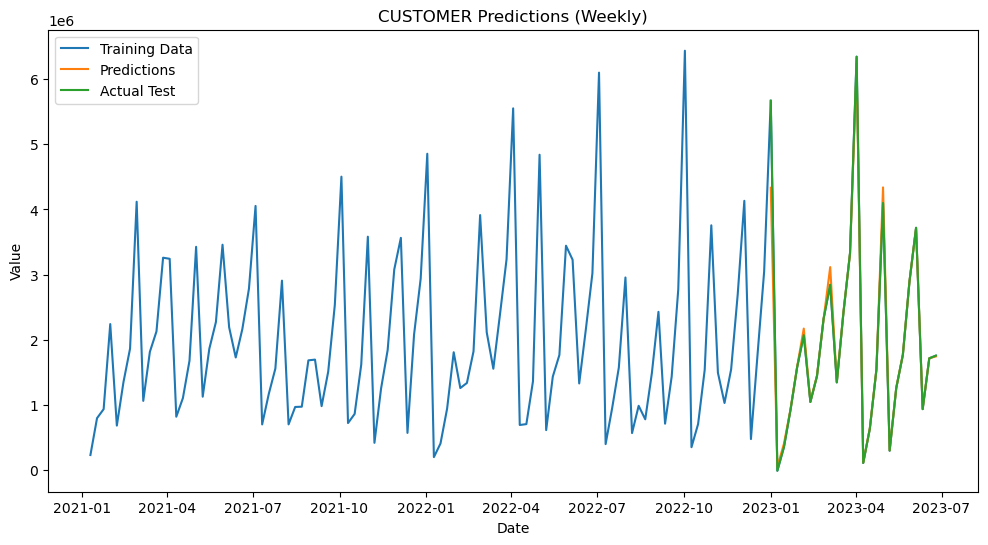

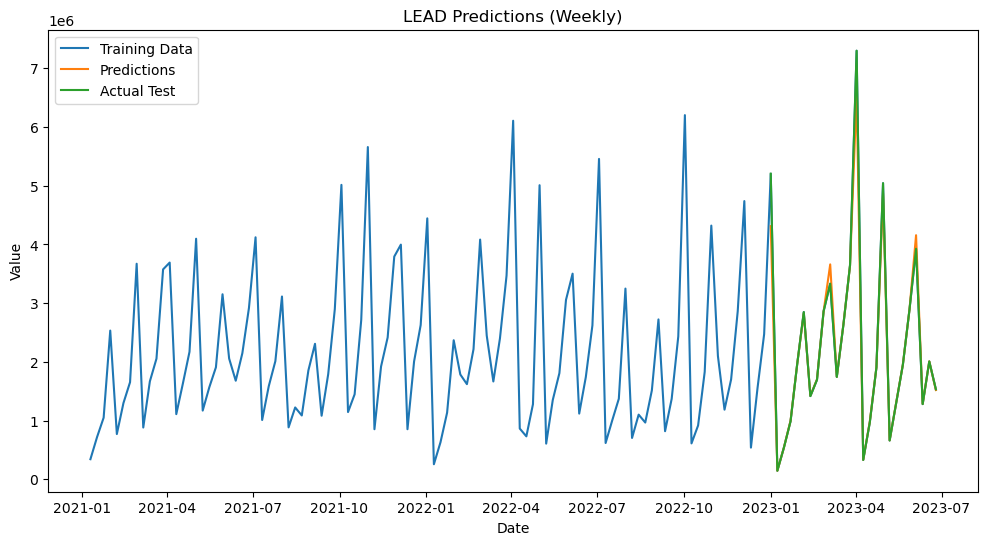

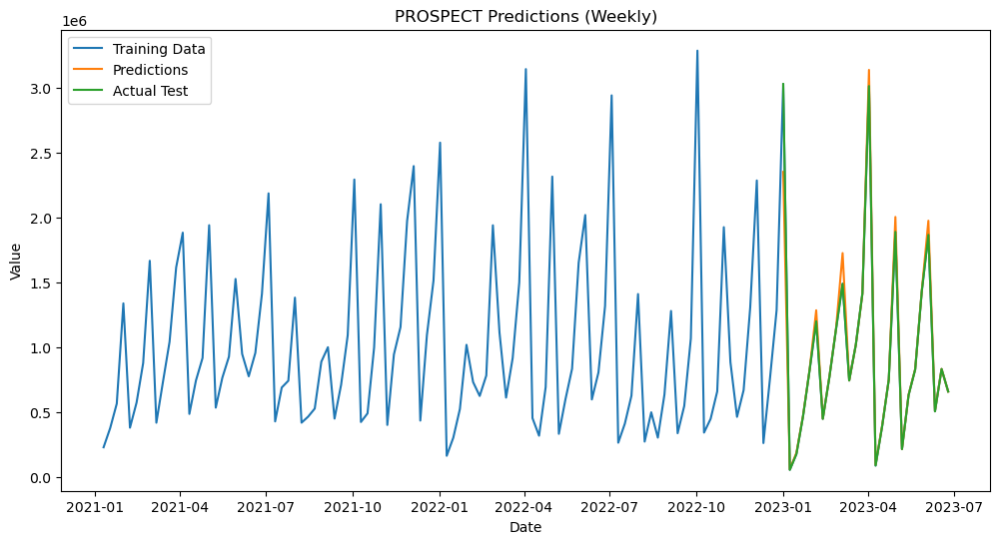

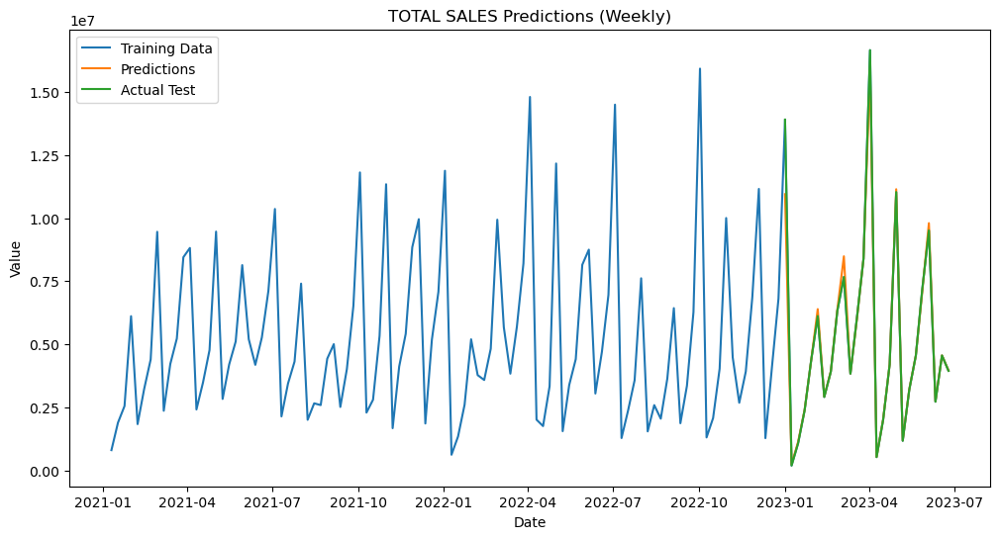

In [43]:
# Resample to weekly frequency
df_grouped_sales_weekly = df_sales_grouped.resample('W').sum()
df_predictions_weekly = df_predictions.resample('W').sum()

# List of columns in df_grouped_sales_weekly
grouped_columns = df_grouped_sales_weekly.columns.tolist()

# Plotting
for column in grouped_columns:
    plt.figure(figsize=(12, 6))
    plt.plot(df_grouped_sales_weekly.index, df_grouped_sales_weekly[column], label='Training Data')
    plt.plot(df_predictions_weekly.index, df_predictions_weekly[column], label='Predictions')
    plt.plot(df_grouped_sales_weekly.index[-len(df_predictions_weekly[column]):], df_grouped_sales_weekly[column][-len(df_predictions_weekly[column]):], label='Actual Test')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.title(f'{column} Predictions (Weekly)')
    plt.legend()
    plt.show()